In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf

In [3]:
train_dir = '/kaggle/input/ozon-tech-competition/ozon_train_ver2-20240903T060946Z-001/ozon_train_ver2'
validation_dir = '/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2'

BATCH_SIZE = 32
IMG_SIZE = (160, 160)

train_dataset = tf.keras.utils.image_dataset_from_directory(train_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)

Found 6454 files belonging to 2 classes.


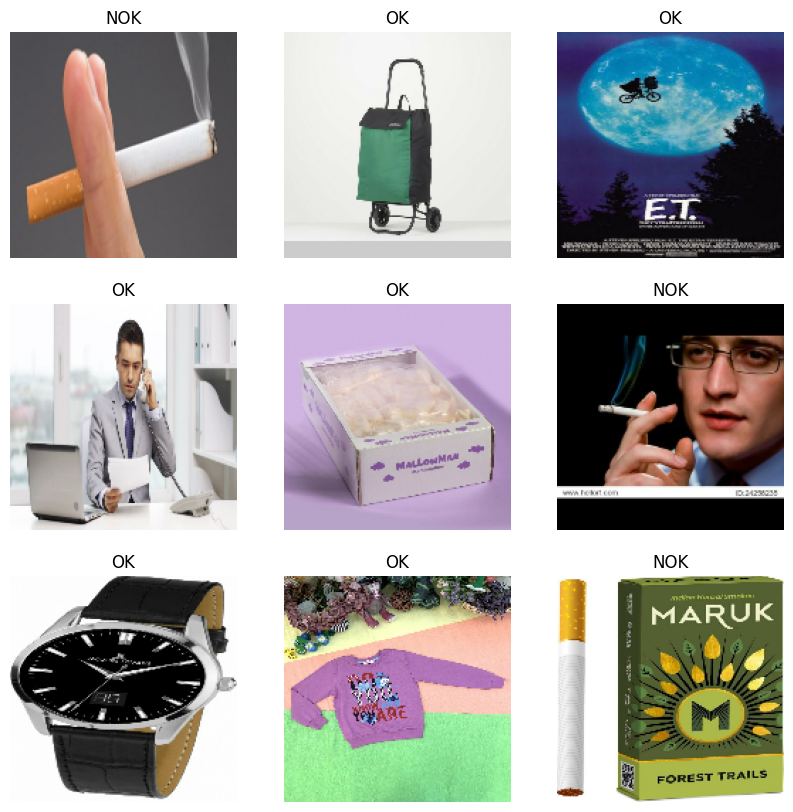

In [4]:
class_names = train_dataset.class_names

plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [5]:
validation_dataset = tf.keras.utils.image_dataset_from_directory(validation_dir,
                                                                 shuffle=True,
                                                                 batch_size=BATCH_SIZE,
                                                                 image_size=IMG_SIZE)

Found 83 files belonging to 2 classes.


In [6]:
val_batches = tf.data.experimental.cardinality(validation_dataset)
test_dataset = validation_dataset.take(val_batches // 5)
validation_dataset = validation_dataset.skip(val_batches // 5)
print('Number of validation batches: %d' % tf.data.experimental.cardinality(validation_dataset))
print('Number of test batches: %d' % tf.data.experimental.cardinality(test_dataset))

Number of validation batches: 3
Number of test batches: 0


In [8]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

In [9]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
])

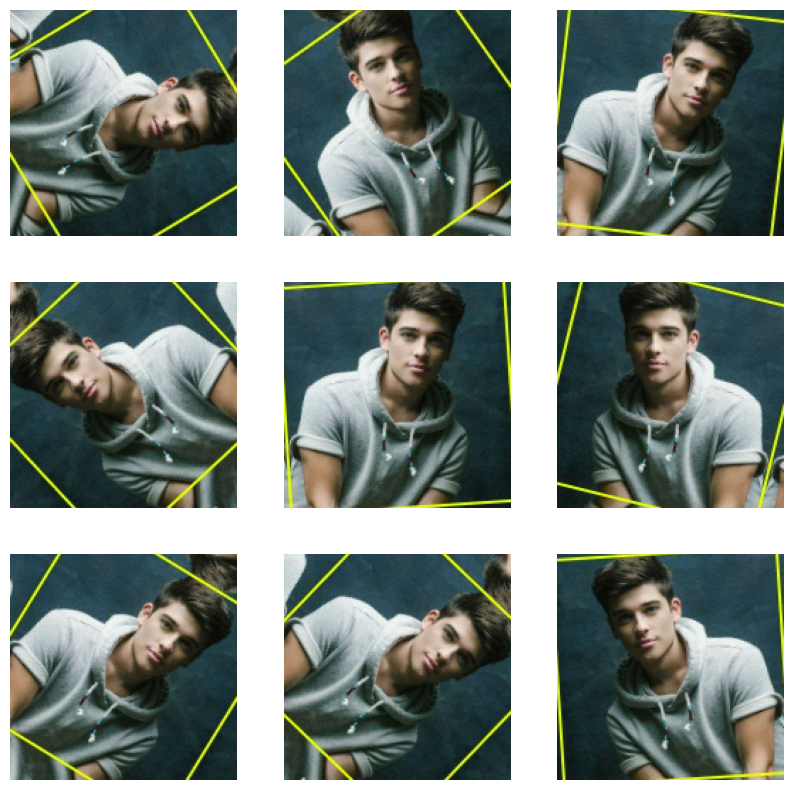

In [10]:
for image, _ in train_dataset.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

In [11]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [12]:
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=(160, 160, 3),
                                               include_top=False,
                                               weights='imagenet')

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [13]:
image_batch, label_batch = next(iter(train_dataset))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 5, 5, 1280)


In [14]:
base_model.trainable = False

In [15]:
base_model.summary()

Model: "mobilenetv2_1.00_160"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 160, 160,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 80, 80,    │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 80, 80,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 80, 80,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 80, 80,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 80, 80,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 80, 80,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 80, 80,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 80, 80,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 80, 80,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 81, 81,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 40, 40,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 40, 40,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 40, 40,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 40, 40,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [18]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


In [26]:
prediction_layer_1 = tf.keras.layers.Dense(1280)
prediction_batch = prediction_layer_1(feature_batch_average)
print(prediction_batch.shape)

(32, 1280)


In [27]:
prediction_layer = tf.keras.layers.Dense(1)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 1)


In [28]:
inputs = tf.keras.Input(shape=(160, 160, 3))
x = data_augmentation(inputs)
x = preprocess_input(inputs)
x = base_model(x, training=False)
x = global_average_layer(x)
x = prediction_layer_1(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [29]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [30]:
model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_160            │ (None, 5, 5, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1280)           │     1,639,680 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,898,945 (14.87 MB)

 Trainable params: 1,640,961 (6.26 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [32]:
initial_epochs = 3
history = model.fit(train_dataset,
                    epochs=initial_epochs,
                    validation_data=validation_dataset)

Epoch 1/3
202/202 ━━━━━━━━━━━━━━━━━━━━ 71s 304ms/step - accuracy: 0.8211 - loss: 0.3900 - val_accuracy: 0.9398 - val_loss: 0.1856
Epoch 2/3
202/202 ━━━━━━━━━━━━━━━━━━━━ 48s 238ms/step - accuracy: 0.9028 - loss: 0.2479 - val_accuracy: 0.9277 - val_loss: 0.1725
Epoch 3/3
202/202 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - accuracy: 0.9007 - loss: 0.2450 - val_accuracy: 0.9398 - val_loss: 0.2047


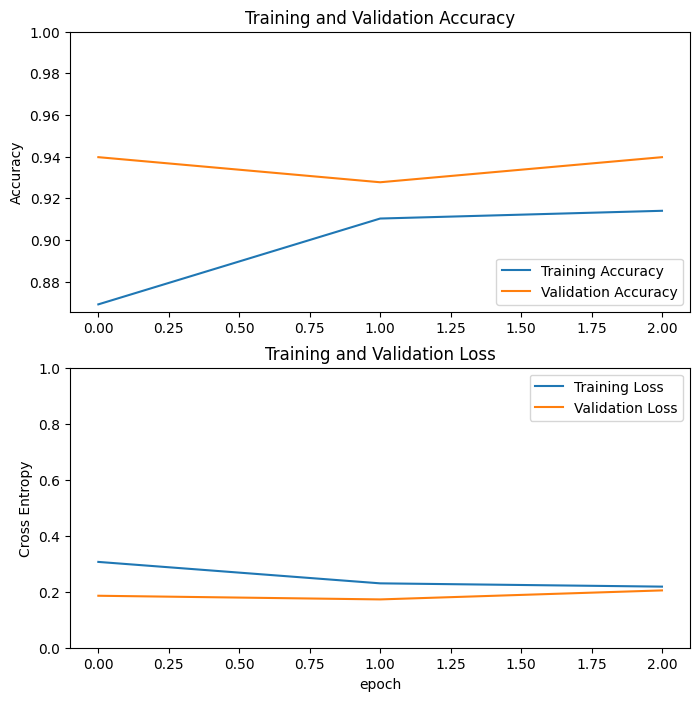

In [33]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [34]:
base_model.trainable = True

In [35]:
print("Number of layers in the base model: ", len(base_model.layers))
fine_tune_at = 100
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

Number of layers in the base model:  154


In [43]:
model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate/20),
              metrics=['accuracy'])

In [44]:
model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 160, 160, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_160            │ (None, 5, 5, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1280)           │     1,639,680 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,898,945 (14.87 MB)

 Trainable params: 3,502,401 (13.36 MB)

 Non-trainable params: 396,544 (1.51 MB)

In [45]:
fine_tune_epochs = 30
total_epochs =  initial_epochs + fine_tune_epochs

callback = [
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        min_delta=1e-3,
        patience=4,
        verbose=1)
]

history_fine = model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1], callbacks=[callback],
                         validation_data=validation_dataset)

Epoch 3/33
202/202 ━━━━━━━━━━━━━━━━━━━━ 72s 271ms/step - accuracy: 0.9664 - loss: 0.0852 - val_accuracy: 0.9518 - val_loss: 0.1939
Epoch 4/33
202/202 ━━━━━━━━━━━━━━━━━━━━ 48s 236ms/step - accuracy: 0.9770 - loss: 0.0715 - val_accuracy: 0.9518 - val_loss: 0.1937
Epoch 5/33
202/202 ━━━━━━━━━━━━━━━━━━━━ 47s 233ms/step - accuracy: 0.9820 - loss: 0.0606 - val_accuracy: 0.9639 - val_loss: 0.1815
Epoch 6/33
202/202 ━━━━━━━━━━━━━━━━━━━━ 48s 235ms/step - accuracy: 0.9799 - loss: 0.0557 - val_accuracy: 0.9639 - val_loss: 0.1716
Epoch 7/33
202/202 ━━━━━━━━━━━━━━━━━━━━ 47s 232ms/step - accuracy: 0.9864 - loss: 0.0497 - val_accuracy: 0.9518 - val_loss: 0.1659
Epoch 8/33
202/202 ━━━━━━━━━━━━━━━━━━━━ 48s 239ms/step - accuracy: 0.9844 - loss: 0.0452 - val_accuracy: 0.9639 - val_loss: 0.1604
Epoch 9/33
202/202 ━━━━━━━━━━━━━━━━━━━━ 48s 236ms/step - accuracy: 0.9883 - loss: 0.0396 - val_accuracy: 0.9518 - val_loss: 0.1659
Epoch 10/33
202/202 ━━━━━━━━━━━━━━━━━━━━ 49s 242ms/step - accuracy: 0.9888 - loss: 

In [46]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

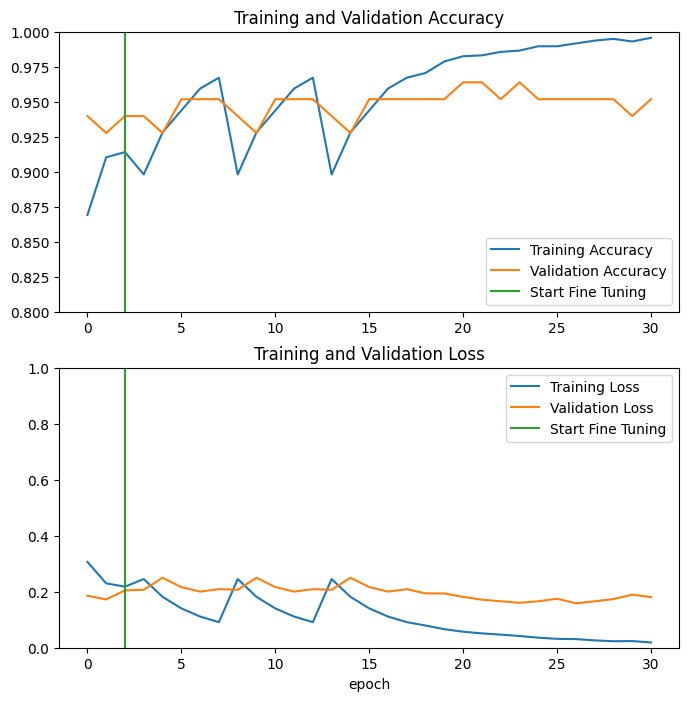

In [47]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [48]:
# Save the entire model as a `.keras` zip archive.
model.save('/kaggle/working/MobileNet_model.keras')

In [49]:
model = tf.keras.models.load_model('/kaggle/working/MobileNet_model.keras')

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.19.47.png


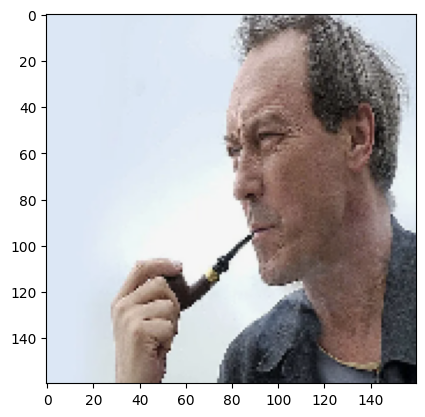

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.21.05.png


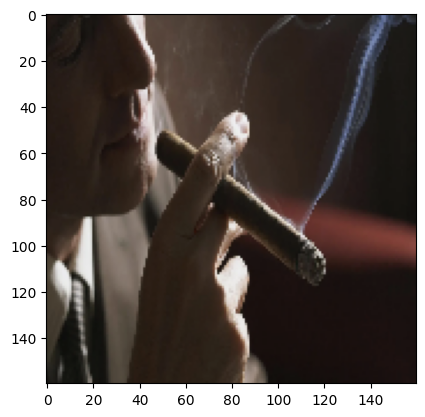

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.19.44.png


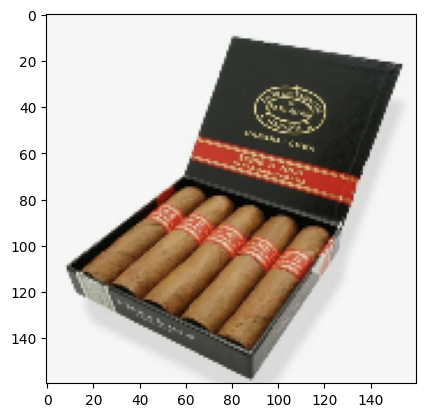

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.21.47.png


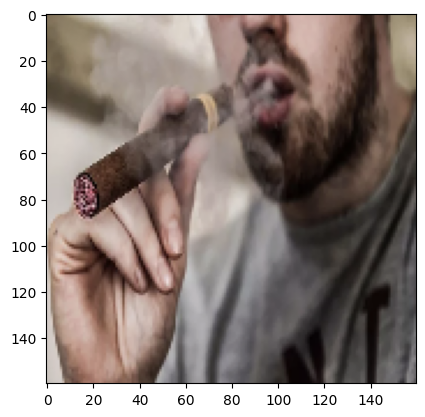

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.20.19.png


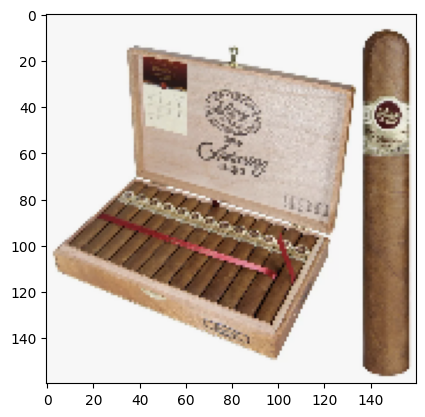

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.22.51.png


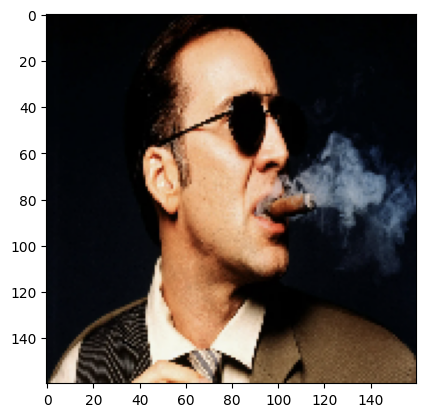

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.22.44.png


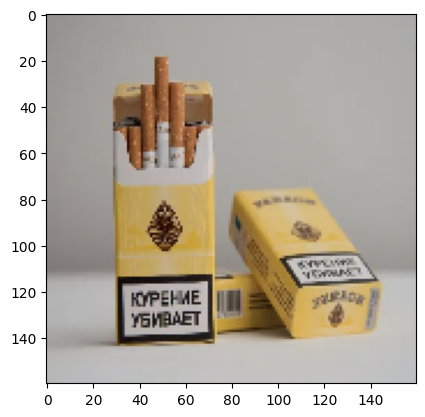

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.25.15.png


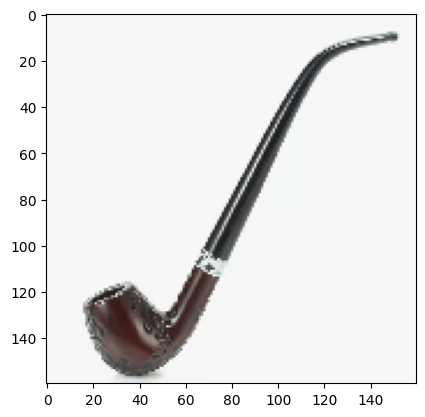

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.22.06.png


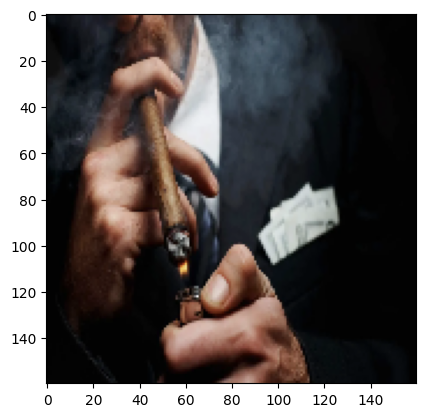

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.24.41.png


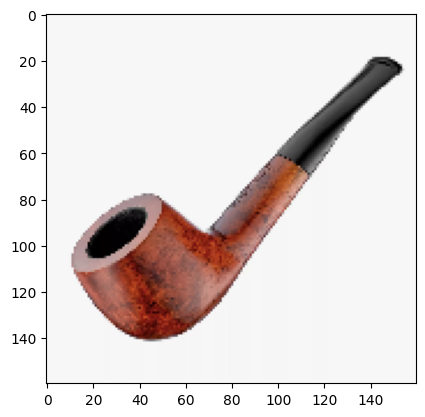

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.23.13.png


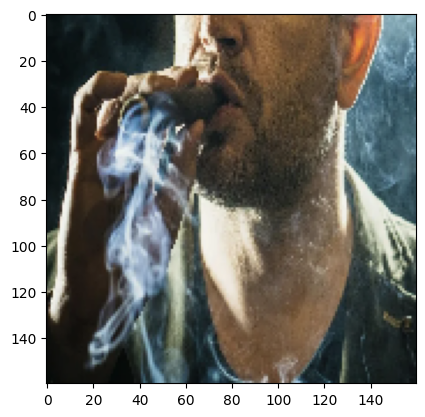

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.24.39.png


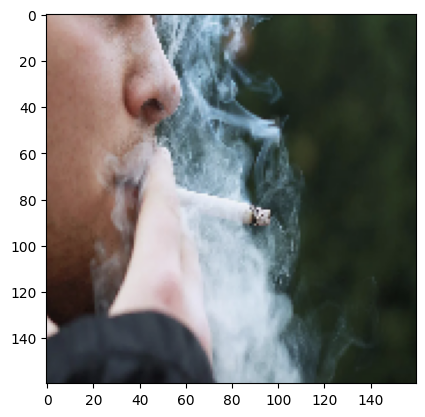

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.22.21.png


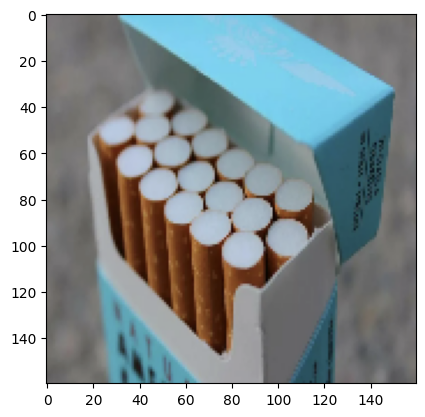

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.23.23.png


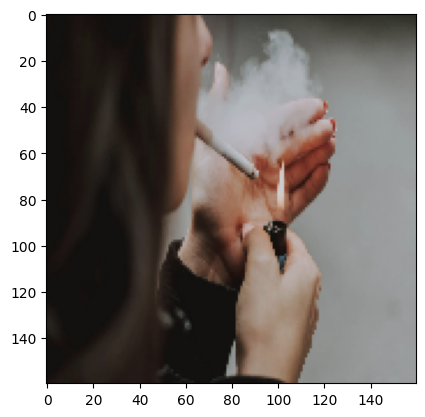

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[0]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.22.35.png


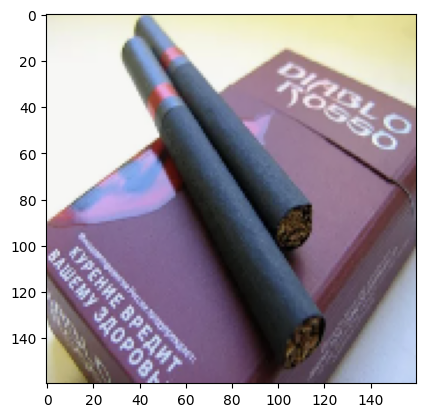

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.23.39.png


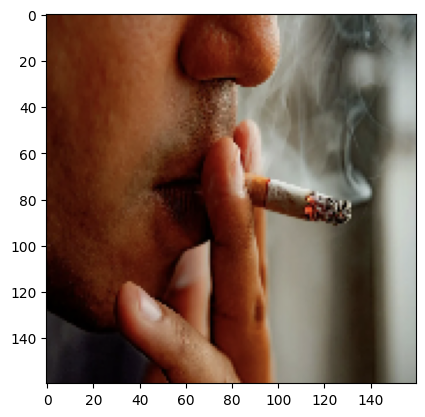

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.22.20.png


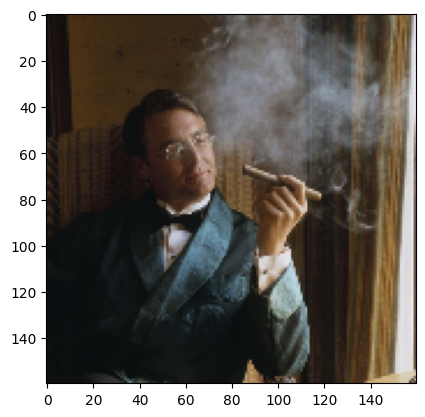

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.25.24.png


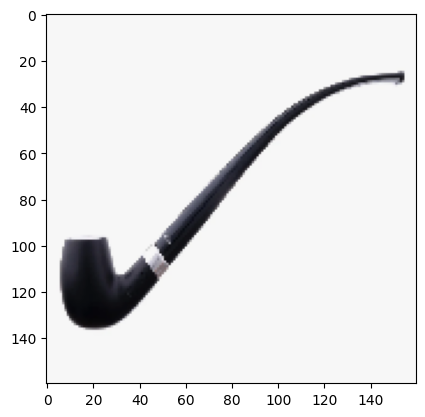

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.18.35.png


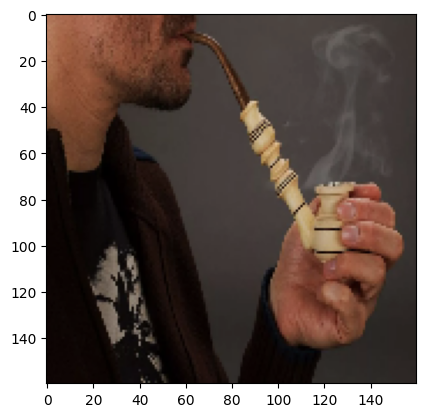

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.19.39.png


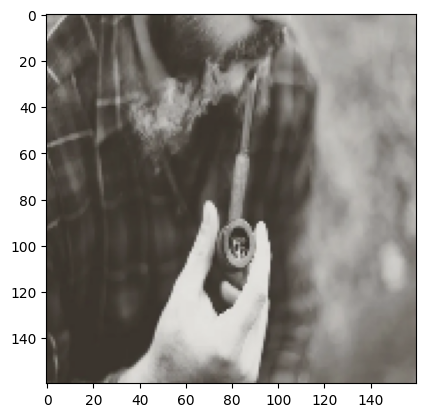

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.25.48.png


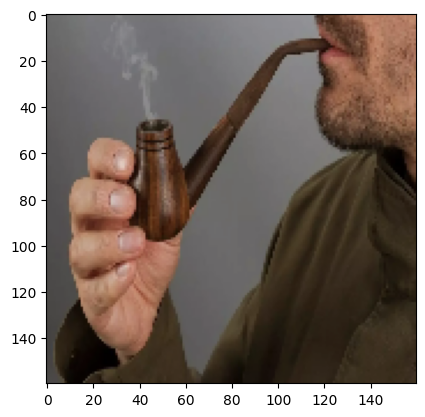

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.20.55.png


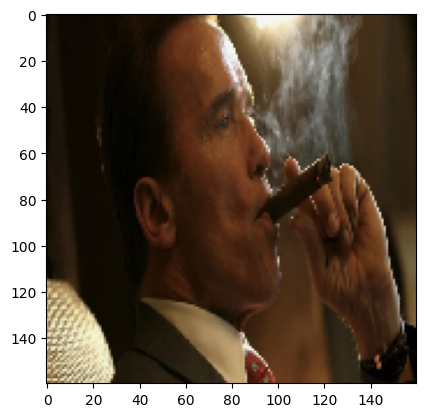

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.24.00.png


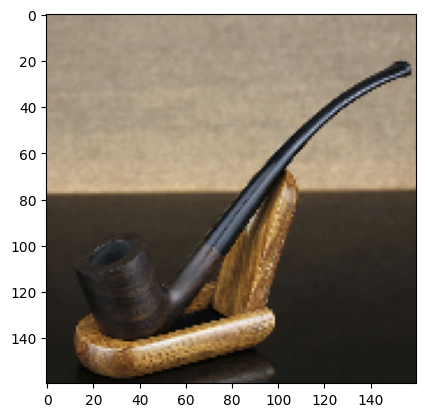

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[0]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.19.07.png


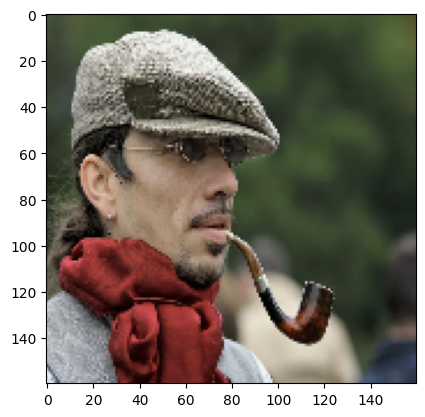

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.21.39.png


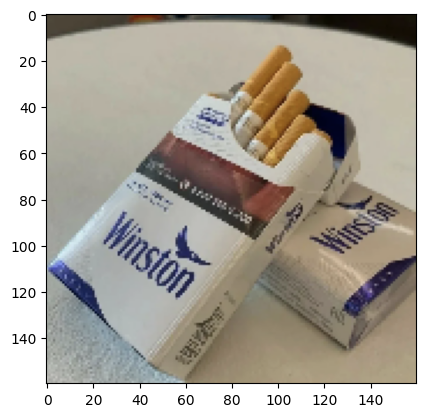

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.21.15.png


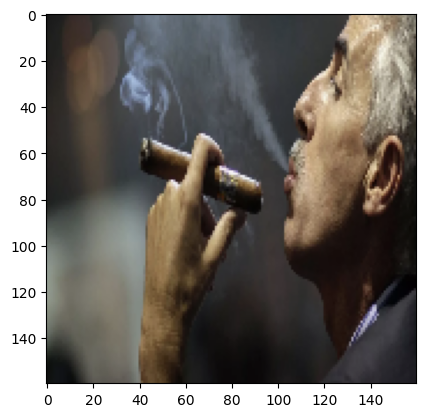

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.21.00.png


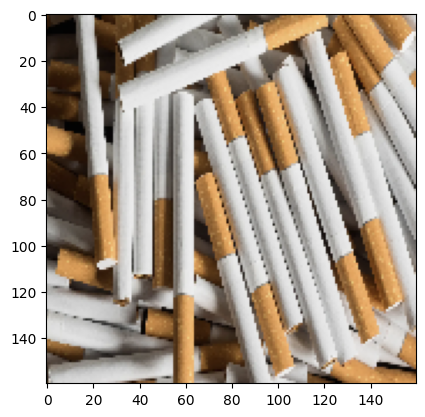

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.23.56.png


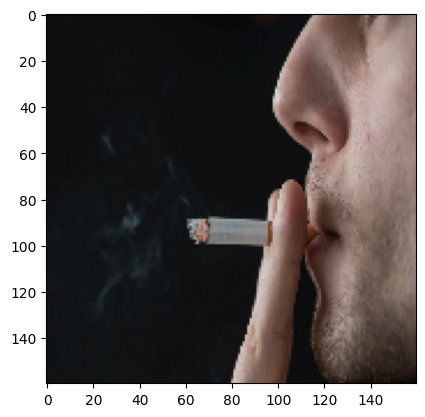

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.23.02.png


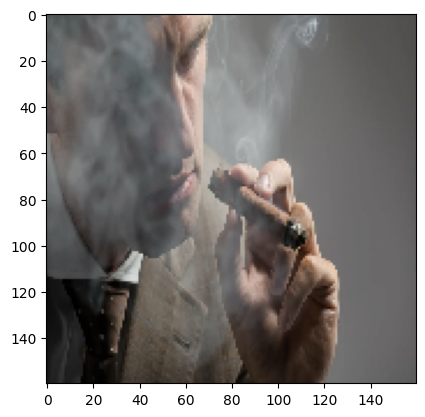

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.24.51.png


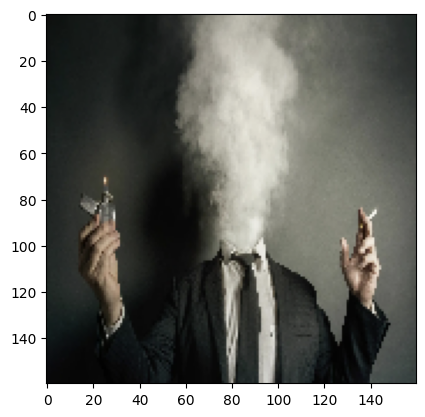

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.19.33.png


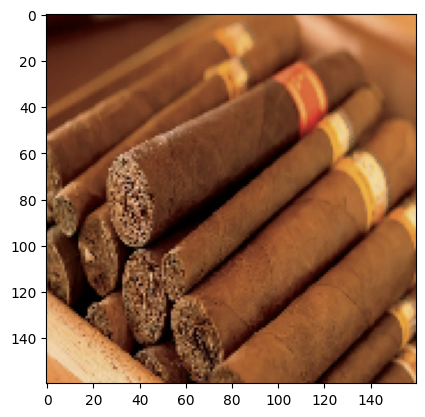

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.18.49.png


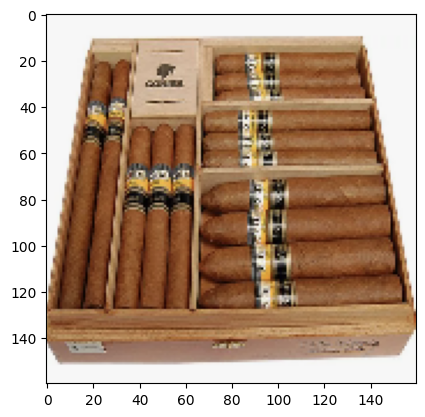

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.21.08.png


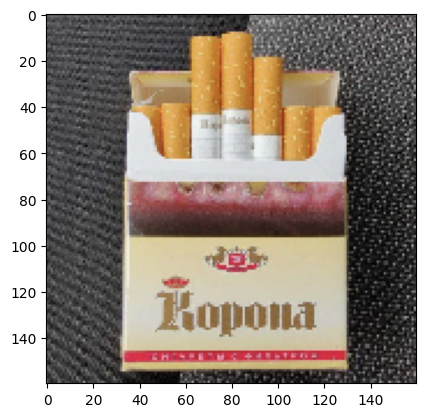

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.24.10.png


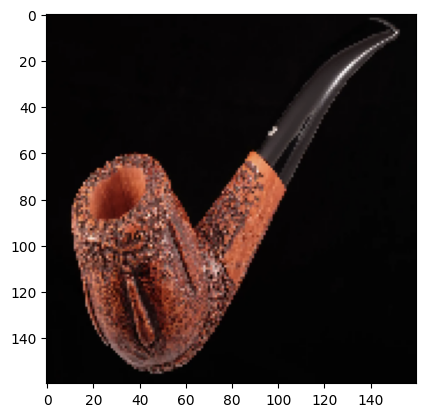

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.22.12.png


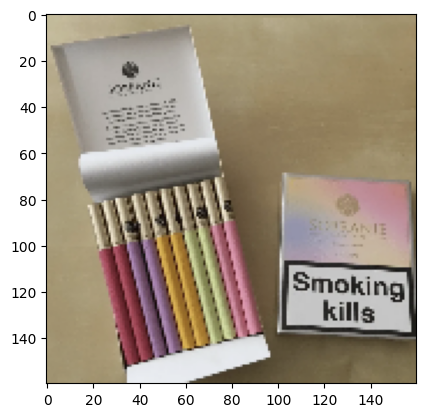

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.19.22.png


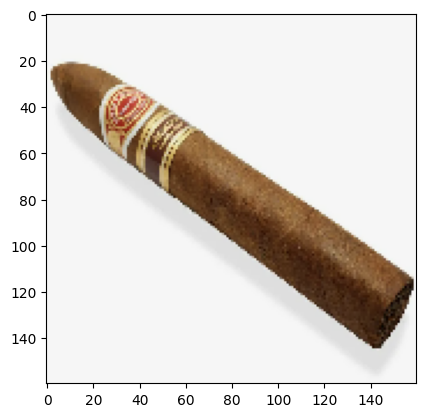

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.21.36.png


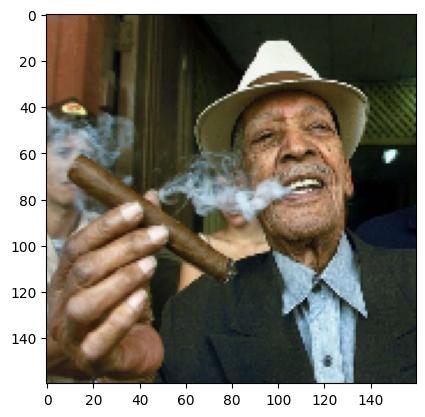

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.24.06.png


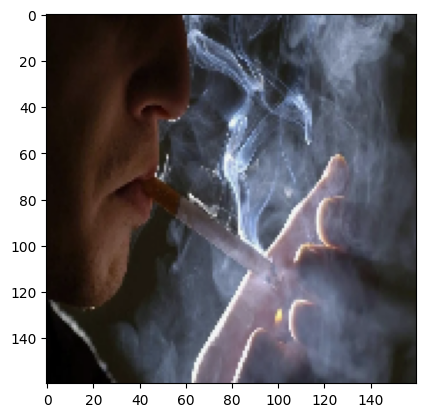

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.24.20.png


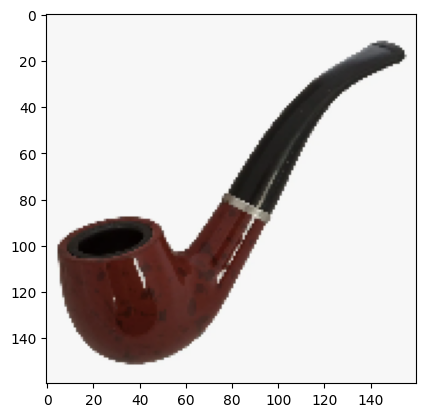

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.19.54.png


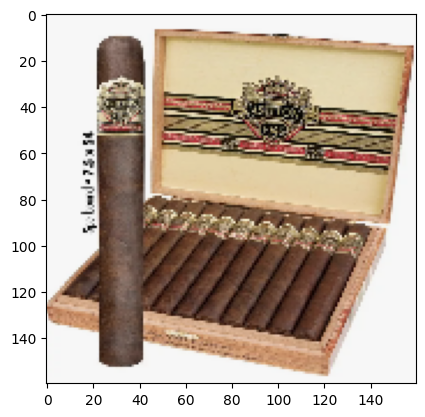

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.23.48.png


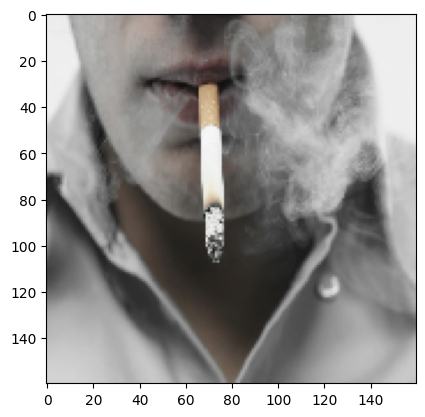

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.24.29.png


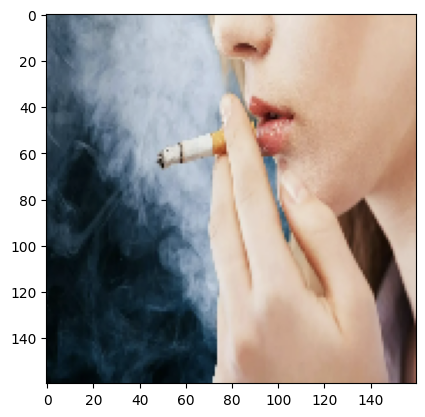

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.21.56.png


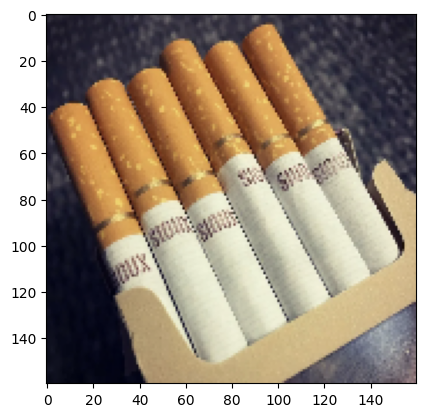

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.23.14.png


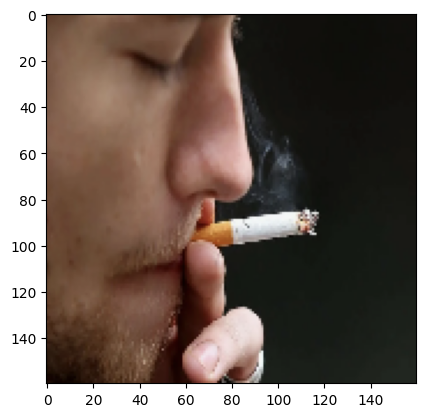

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.19.19.png


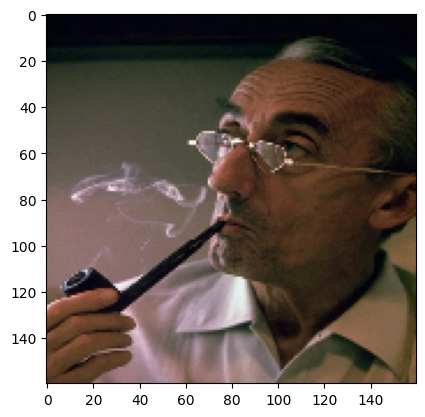

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.19.58.png


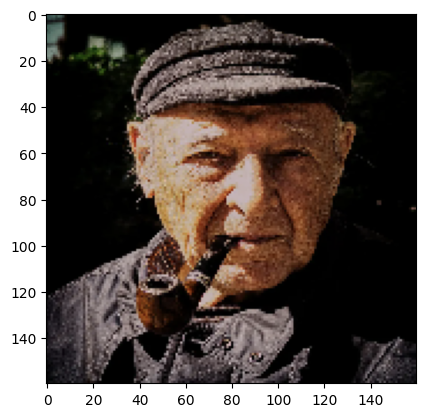

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.19.30.png


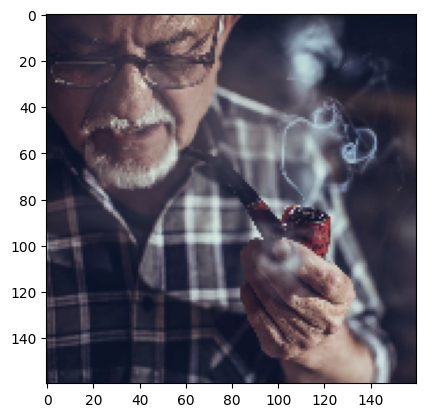

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.18.47.png


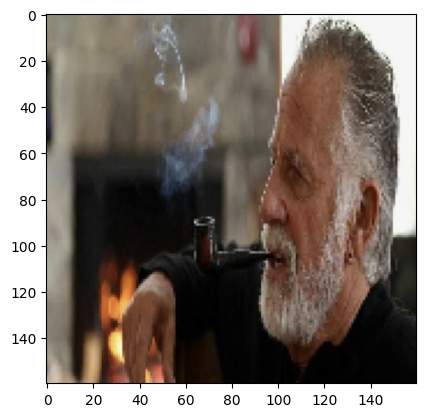

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.21.25.png


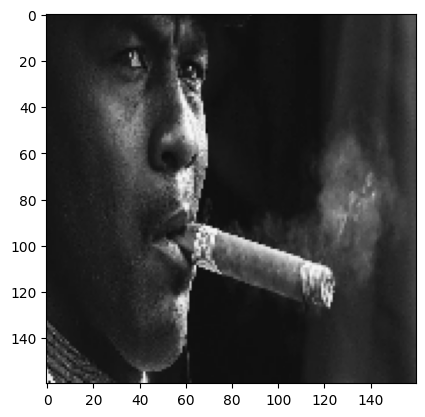

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.20.10.png


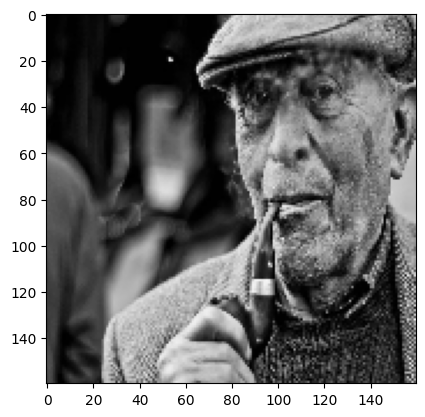

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.24.27.png


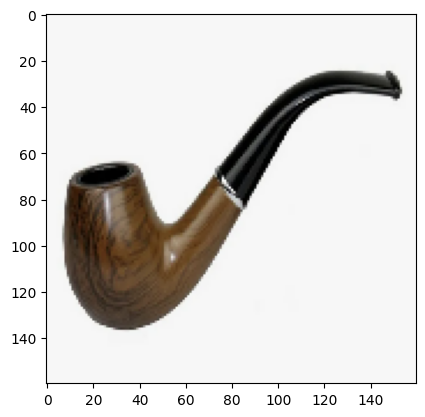

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.23.26.png


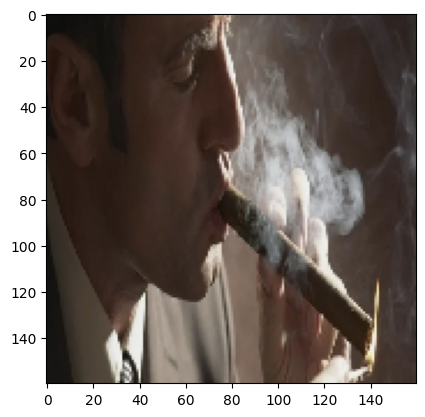

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.24.58.png


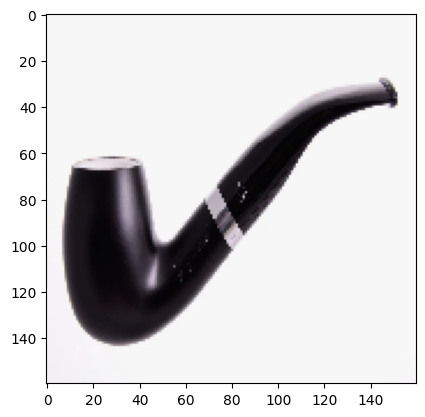

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[0]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.21.18.png


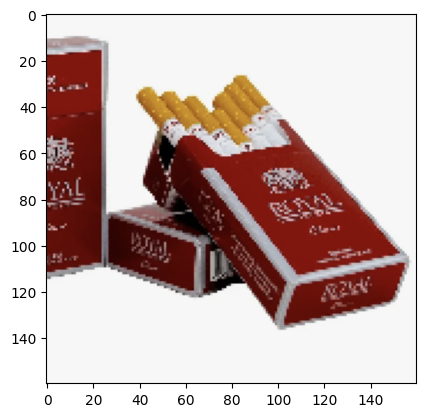

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.19.08.png


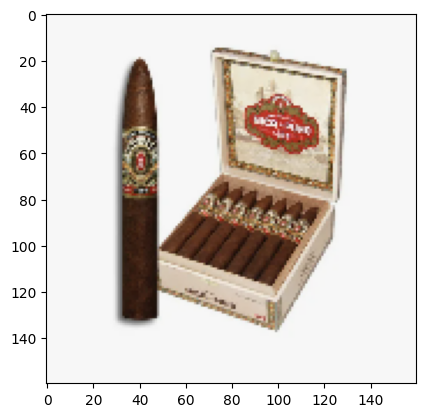

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.25.06.png


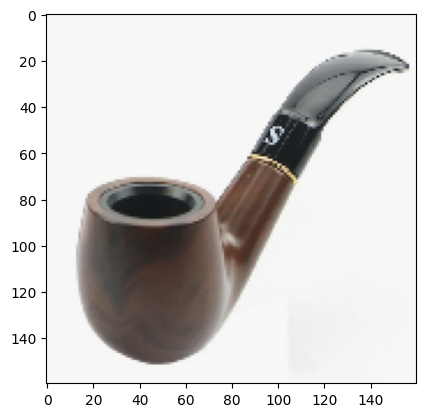

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.20.48.png


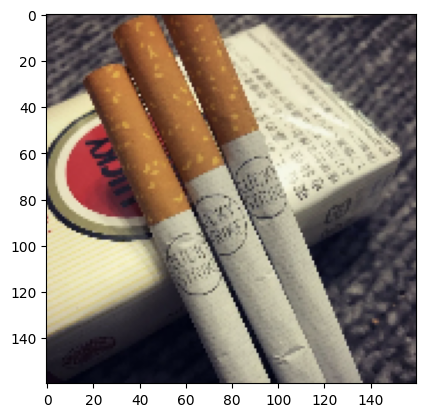

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 22.24.16.png


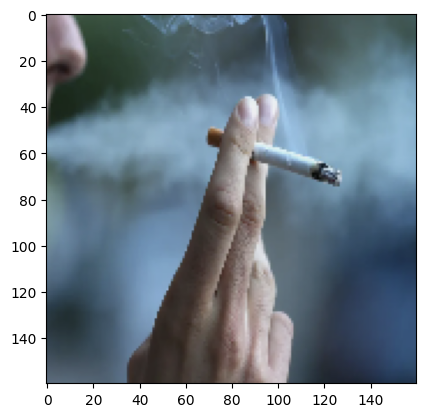

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
tf.Tensor([[1]], shape=(1, 1), dtype=int32)
/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK/Снимок экрана 2024-09-01 в 21.20.08.png


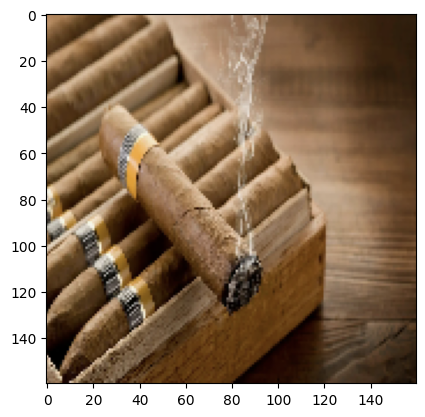

In [50]:
TEST_IMAGES_DIR = '/kaggle/input/ozon-tech-competition/ozon_val_ver2-20240903T060655Z-001/ozon_val_ver2/NOK'
all_image_names = os.listdir(TEST_IMAGES_DIR)

for image_name in all_image_names:
  img_path = os.path.join(TEST_IMAGES_DIR, image_name)
  image = tf.keras.utils.load_img(img_path, target_size=(160, 160))
  plt.imshow(image)
  input_arr = tf.keras.utils.img_to_array(image)
  input_arr = np.array([input_arr])  # Convert single image to a batch.
  predictions = model.predict(input_arr)
  predictions = tf.nn.sigmoid(predictions)
  predictions = tf.where(predictions < 0.8, 1, 0)
  print(predictions)
  print(img_path)
  plt.show()